In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
import tqdm
import pandas as pd
import numpy as np
import json
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.image as mpimg
import seaborn as sns
from gensim.parsing.preprocessing import STOPWORDS,remove_stopwords
from itertools import cycle
from wordcloud import WordCloud
from prettytable import PrettyTable
from operator import itemgetter

In [2]:
datadir = r"E:\VQA_Dataset"
Annot_dir = datadir+r"\Annotations"
Quest_dir = datadir+r"\Questions"
img_train_dir = datadir+r"\train2014"

taskType    = ['OpenEnded','MultipleChoice']
dataType    = 'mscoco'
dataSubType = ['train2014', 'val2014', 'test2014']

annot_train_file     = '%s\%s_%s_annotations.json'%(Annot_dir,dataType,dataSubType[0])
annot_val_file     = '%s\%s_%s_annotations.json'%(Annot_dir,dataType,dataSubType[1])

ques_train_file = '%s\%s_%s_%s_questions.json'%(Quest_dir,taskType[0],dataType,dataSubType[0])
ques_val_file = '%s\%s_%s_%s_questions.json'%(Quest_dir,taskType[0],dataType,dataSubType[1])
ques_test_file = '%s\%s_%s_%s_questions.json'%(Quest_dir,taskType[0],dataType,dataSubType[2])

In [3]:
with open(ques_train_file,'r') as f:
    quest_train = json.load(f)
    questions_train = quest_train["questions"]

with open(annot_train_file,'r') as f:
    annot_train = json.load(f)
    annotations_train = annot_train["annotations"]

In [4]:
print(questions_train[0])
print('')
print(annotations_train[0])

{'question': 'What shape is the bench seat?', 'image_id': 487025, 'question_id': 4870250}

{'question_type': 'what', 'multiple_choice_answer': 'curved', 'answers': [{'answer': 'oval', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'semi circle', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'curved', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'curved', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'double curve', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'banana', 'answer_confidence': 'maybe', 'answer_id': 6}, {'answer': 'curved', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'wavy', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'twisting', 'answer_confidence': 'no', 'answer_id': 9}, {'answer': 'curved', 'answer_confidence': 'maybe', 'answer_id': 10}], 'image_id': 487025, 'answer_type': 'other', 'question_id': 4870250}


In [5]:
ques_train_df = pd.DataFrame(questions_train)
annot_train_df = pd.DataFrame(annotations_train)

In [6]:
ques_train_df

,question,image_id,question_id
0,What shape is the bench seat?,487025,4870250
1,Is there a shadow?,487025,4870251
2,Is this one bench or multiple benches?,487025,4870252
3,Is this a modern train?,78077,780770
4,What color is the stripe on the train?,78077,780771
...,...,...,...
248344,What is on the blue pillow?,382589,3825891
248345,Is anybody sleeping in the bed?,382589,3825892
248346,Is this a hotel?,526896,5268960
248347,Which company made the computer?,526896,5268961


In [7]:
annot_train_df

,question_type,multiple_choice_answer,answers,image_id,answer_type,question_id
0,what,curved,"[{'answer': 'oval', 'answer_confidence': 'yes'...",487025,other,4870250
1,is there a,yes,"[{'answer': 'yes', 'answer_confidence': 'yes',...",487025,yes/no,4870251
2,is this,1,"[{'answer': '1', 'answer_confidence': 'yes', '...",487025,other,4870252
3,is this a,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",78077,yes/no,780770
4,what color is the,white,"[{'answer': 'white', 'answer_confidence': 'yes...",78077,other,780771
...,...,...,...,...,...,...
248344,what is on the,book,"[{'answer': 'book', 'answer_confidence': 'yes'...",382589,other,3825891
248345,is,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",382589,yes/no,3825892
248346,is this a,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",526896,yes/no,5268960
248347,which,apple,"[{'answer': 'apple', 'answer_confidence': 'may...",526896,other,5268961


In [8]:
merge_df = pd.merge(ques_train_df,annot_train_df,how='inner',left_on=['image_id', 'question_id'], right_on=['image_id', 'question_id'])

In [9]:
merge_df

,question,image_id,question_id,question_type,multiple_choice_answer,answers,answer_type
0,What shape is the bench seat?,487025,4870250,what,curved,"[{'answer': 'oval', 'answer_confidence': 'yes'...",other
1,Is there a shadow?,487025,4870251,is there a,yes,"[{'answer': 'yes', 'answer_confidence': 'yes',...",yes/no
2,Is this one bench or multiple benches?,487025,4870252,is this,1,"[{'answer': '1', 'answer_confidence': 'yes', '...",other
3,Is this a modern train?,78077,780770,is this a,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",yes/no
4,What color is the stripe on the train?,78077,780771,what color is the,white,"[{'answer': 'white', 'answer_confidence': 'yes...",other
...,...,...,...,...,...,...,...
248344,What is on the blue pillow?,382589,3825891,what is on the,book,"[{'answer': 'book', 'answer_confidence': 'yes'...",other
248345,Is anybody sleeping in the bed?,382589,3825892,is,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",yes/no
248346,Is this a hotel?,526896,5268960,is this a,no,"[{'answer': 'no', 'answer_confidence': 'yes', ...",yes/no
248347,Which company made the computer?,526896,5268961,which,apple,"[{'answer': 'apple', 'answer_confidence': 'may...",other


# Analysis on Questions
* Number of Question Per Image
* Length of Question(Min & Max words)
* Word Frequency in Questions
* Duplicate Question on Same Image

# Number of Question Per Image

In [10]:
ques_per_image = pd.DataFrame(merge_df.groupby(['image_id'],as_index=False).agg({'question':'count'}))

In [11]:
print("Max number of questions on a image",max(ques_per_image['question'].values))
print("Min number of questions on a image",min(ques_per_image['question'].values))

Max number of questions on a image 3
Min number of questions on a image 3


# Length of Question(Min & Max words)

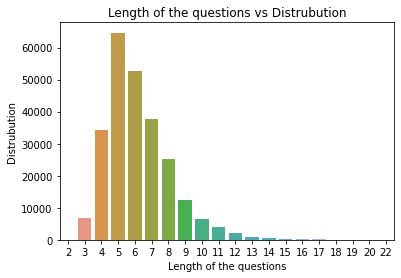

In [12]:
sns.countplot(merge_df["question"].apply(lambda x: len(x.split())).values)
plt.title("Length of the questions vs Distrubution")
plt.xlabel("Length of the questions")
plt.ylabel("Distrubution")
plt.show()

Most of the questions have the length between 4 to 10.

In [13]:
print("A sentence has max words:",max(merge_df["question"].apply(lambda x: len(x.split()))))
print("A sentence has min words:",min(merge_df["question"].apply(lambda x: len(x.split()))))
print('A sentence has average words:',int(np.mean(merge_df["question"].apply(lambda x: len(x.split())))))
print('There are total',len(set(' '.join(merge_df["question"]).split())),'unique words')

A sentence has max words: 22
A sentence has min words: 2
A sentence has average words: 6
There are total 22225 unique words


# Word Frequency in Questions

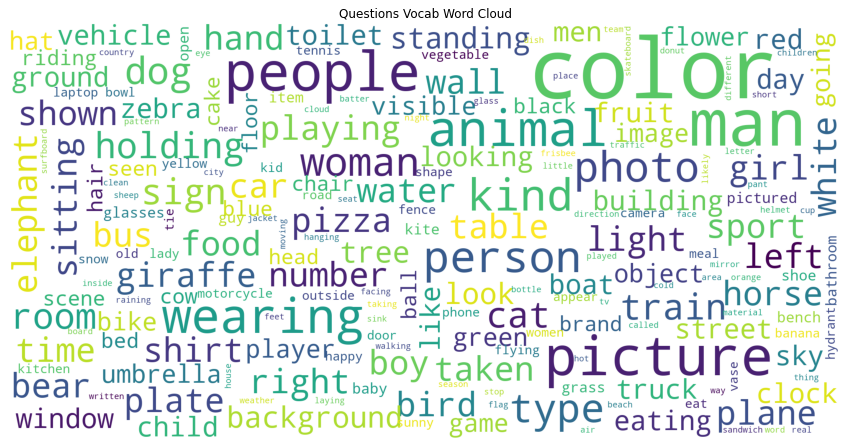

In [14]:
word_cloud = WordCloud(background_color='white',max_font_size=40,scale=5,stopwords=STOPWORDS,collocations=False,random_state=42).generate_from_text(" ".join(merge_df["question"]).lower())
fig = plt.figure(1,figsize=(15,12))
plt.axis("off")
plt.title("Questions Vocab Word Cloud")
fig.subplots_adjust(top=2.3)
plt.imshow(word_cloud)
plt.show()

In [15]:
word_cloud.words_

{'color': 1.0,
 'man': 0.5396831427377379,
 'picture': 0.37673340678545647,
 'people': 0.37418791079366287,
 'animal': 0.3283689829413776,
 'wearing': 0.31096842825120624,
 'person': 0.256753162873751,
 'kind': 0.24554538201436116,
 'photo': 0.22491546673758595,
 'woman': 0.1968010333953877,
 'type': 0.1928118232589947,
 'dog': 0.17457543406405532,
 'cat': 0.16070817978040347,
 'room': 0.1585806010409939,
 'holding': 0.15029824094829225,
 'sign': 0.14805668477641426,
 'train': 0.13985030963869155,
 'shirt': 0.12609703278750808,
 'food': 0.12066410850651571,
 'water': 0.1205881235515368,
 'plane': 0.11656092093765434,
 'bus': 0.11469928954067095,
 'plate': 0.10831655332244215,
 'boy': 0.10736674138520573,
 'playing': 0.10425135823107025,
 'girl': 0.10174385471676609,
 'sitting': 0.09832453174271494,
 'bird': 0.09707077998556286,
 'sport': 0.09657687777819991,
 'time': 0.0949052087686638,
 'table': 0.09414535921887467,
 'number': 0.09391740435393792,
 'shown': 0.0932335397591277,
 'horse

In [16]:
word_cloud.stopwords

frozenset({'a',
           'about',
           'above',
           'across',
           'after',
           'afterwards',
           'again',
           'against',
           'all',
           'almost',
           'alone',
           'along',
           'already',
           'also',
           'although',
           'always',
           'am',
           'among',
           'amongst',
           'amoungst',
           'amount',
           'an',
           'and',
           'another',
           'any',
           'anyhow',
           'anyone',
           'anything',
           'anyway',
           'anywhere',
           'are',
           'around',
           'as',
           'at',
           'back',
           'be',
           'became',
           'because',
           'become',
           'becomes',
           'becoming',
           'been',
           'before',
           'beforehand',
           'behind',
           'being',
           'below',
           'beside',
           'besides'

In [17]:
ques_word_freq = word_cloud.process_text(" ".join(merge_df["question"]).lower())

In [18]:
ques_word_freq

{'shape': 805,
 'bench': 999,
 'seat': 534,
 'shadow': 442,
 'multiple': 29,
 'benches': 179,
 'modern': 357,
 'train': 3681,
 'color': 26321,
 'stripe': 503,
 'bus': 3019,
 'driver': 174,
 'kind': 6463,
 'antidepressant': 1,
 'medication': 4,
 'moving': 684,
 'sale': 122,
 'tent': 118,
 'grocery': 30,
 'store': 352,
 'dog': 4595,
 'bed': 1371,
 'frame': 159,
 'clock': 1889,
 'direction': 742,
 'weathervane': 4,
 'pointing': 256,
 'term': 22,
 'describes': 7,
 'bereaved': 1,
 'wife': 6,
 'walk': 167,
 'building': 1923,
 'picture': 9916,
 'animal': 8643,
 'man': 14205,
 'lap': 53,
 'right': 2411,
 'hand': 2386,
 'pizza': 2227,
 'specific': 11,
 'particular': 20,
 'recipe': 20,
 'edible': 141,
 'city': 698,
 'taken': 2349,
 'based': 85,
 'size': 275,
 'wake': 16,
 'approximate': 10,
 'speed': 81,
 'boat': 1631,
 'water': 3174,
 'desk': 491,
 'keyboard': 375,
 'appear': 902,
 'growing': 115,
 'scene': 1243,
 'bird': 2555,
 'person': 6758,
 'shirt': 3319,
 'photo': 5920,
 'woman': 5180,
 '

In [19]:
print("There are ",len(ques_word_freq),"Words After Removing Stop Words")
print("Word Vocab With its Frequency For Question After Removing Stop Words are:")
print("\n".join([f"{key}: {value}" for key, value in sorted(ques_word_freq.items(), key=lambda x: x[1], reverse=True)]))

There are  10944 Words After Removing Stop Words
Word Vocab With its Frequency For Question After Removing Stop Words are:
color: 26321
man: 14205
picture: 9916
people: 9849
animal: 8643
wearing: 8185
person: 6758
kind: 6463
photo: 5920
woman: 5180
type: 5075
dog: 4595
cat: 4230
room: 4174
holding: 3956
sign: 3897
train: 3681
shirt: 3319
food: 3176
water: 3174
plane: 3068
bus: 3019
plate: 2851
boy: 2826
playing: 2744
girl: 2678
sitting: 2588
bird: 2555
sport: 2542
time: 2498
table: 2478
number: 2472
shown: 2454
horse: 2418
right: 2411
car: 2396
hand: 2386
taken: 2349
light: 2340
left: 2339
bear: 2329
wall: 2290
giraffe: 2272
pizza: 2227
elephant: 2155
white: 2135
background: 2127
standing: 2121
look: 2111
tree: 2065
building: 1923
clock: 1889
street: 1889
fruit: 1865
ground: 1840
truck: 1800
sky: 1778
red: 1753
zebra: 1746
window: 1741
men: 1733
day: 1730
eating: 1692
like: 1655
looking: 1653
vehicle: 1647
boat: 1631
child: 1629
toilet: 1628
object: 1625
visible: 1619
image: 1587
game:

In [20]:
#filtereing word vocab whose frequency is greater than 100
ques_filtered_word_freq = {word: frequency for word, frequency in ques_word_freq.items() if frequency >= 100}

In [21]:
total_words = sum(ques_filtered_word_freq.values())
table = PrettyTable(["Word","Count","Coverage"])
word_coverage = {word: np.round((frequency / total_words) * 100,2) for word, frequency in ques_filtered_word_freq.items()}
sorted_counts = sorted(ques_filtered_word_freq.items(), key=lambda x: x[1], reverse=True)
for word, count in sorted_counts:
    coverage_percentage = word_coverage[word]
    table.add_row([word, count, coverage_percentage])
print(table)

+----------------+-------+----------+
|      Word      | Count | Coverage |
+----------------+-------+----------+
|     color      | 26321 |   5.36   |
|      man       | 14205 |   2.9    |
|    picture     |  9916 |   2.02   |
|     people     |  9849 |   2.01   |
|     animal     |  8643 |   1.76   |
|    wearing     |  8185 |   1.67   |
|     person     |  6758 |   1.38   |
|      kind      |  6463 |   1.32   |
|     photo      |  5920 |   1.21   |
|     woman      |  5180 |   1.06   |
|      type      |  5075 |   1.03   |
|      dog       |  4595 |   0.94   |
|      cat       |  4230 |   0.86   |
|      room      |  4174 |   0.85   |
|    holding     |  3956 |   0.81   |
|      sign      |  3897 |   0.79   |
|     train      |  3681 |   0.75   |
|     shirt      |  3319 |   0.68   |
|      food      |  3176 |   0.65   |
|     water      |  3174 |   0.65   |
|     plane      |  3068 |   0.63   |
|      bus       |  3019 |   0.62   |
|     plate      |  2851 |   0.58   |
|      boy  

# Duplicate Question on Same Image

In [22]:
aggregations = {'question_id':'count','multiple_choice_answer':lambda x: " || ".join(x)}
dupli_ques = merge_df.groupby(['image_id', 'question'],as_index=False).agg(aggregations).rename(columns={'question_id': 'count'})
duplicate_questions = dupli_ques[dupli_ques['count'] > 1]

In [23]:
duplicate_questions

,image_id,question,count,multiple_choice_answer
111,312,How many baby elephants are there?,2,1 || 1
1089,2614,What does the man in the blue shirt have in hi...,2,frisbee || frisbee
1235,3008,What color is the woman's hair?,2,brown || brown
4528,11065,What color is the horse?,2,brown || brown
6912,16414,What color is the parking meter?,2,black || black and yellow
...,...,...,...,...
233373,547471,What color is the man's suit?,2,black || black
236365,554455,What color is the clock?,2,gold || gold
238572,559619,What does the red sign say?,2,stop || stop
240657,564264,What is the dog carrying?,2,toy || toy


In [24]:
merge_df[merge_df["image_id"]==312]

,question,image_id,question_id,question_type,multiple_choice_answer,answers,answer_type
174525,How many baby elephants are there?,312,3120,how many,1,"[{'answer': '1', 'answer_confidence': 'yes', '...",number
174526,How many baby elephants are there?,312,3121,how many,1,"[{'answer': '3', 'answer_confidence': 'maybe',...",number
174527,Is the ground shades of brown/tan?,312,3122,is the,yes,"[{'answer': 'yes', 'answer_confidence': 'yes',...",yes/no


In [25]:
merge_df[merge_df["image_id"]==3008]

,question,image_id,question_id,question_type,multiple_choice_answer,answers,answer_type
88572,Is this woman married?,3008,30080,is this,yes,"[{'answer': 'yes', 'answer_confidence': 'yes',...",yes/no
88573,What color is the woman's hair?,3008,30081,what color is the,brown,"[{'answer': 'brown', 'answer_confidence': 'yes...",other
88574,What color is the woman's hair?,3008,30082,what color is the,brown,"[{'answer': 'black', 'answer_confidence': 'yes...",other


# Analysis on Question Type

In [26]:
merge_df.question_type.unique()

array(['what', 'is there a', 'is this', 'is this a', 'what color is the',
       'what is on the', 'is the', 'are these', 'what is',
       'what is in the', 'where is the', 'what color are the',
       'where are the', 'what animal is', 'none of the above',
       'what kind of', 'what is the', 'are there any', 'how',
       'what color is', 'how many', 'why is the', 'who is',
       'is the person', 'what color', 'does this', 'can you',
       'what is this', 'does the', 'is this person', 'is', 'which',
       'is the man', 'what is the man', 'are there', 'what type of',
       'what sport is', 'could', 'what time', 'is this an',
       'what room is', 'what are the', 'why', 'what does the', 'is it',
       'is the woman', 'are they', 'is he', 'are the', 'are', 'do',
       'how many people are', 'is there', 'has', 'what are',
       'what is the person', 'is that a', 'what number is', 'what brand',
       'what is the name', 'do you', 'what is the woman',
       'what is the color o

In [27]:
print("Number of unique Question type in dataset : ",len(merge_df.question_type.unique()))

Number of unique Question type in dataset :  65


In [28]:
ques_type_per_image= merge_df.groupby(['image_id'],as_index=False).agg({'question_type':'count'})

In [29]:
ques_type_per_image

,image_id,question_type
0,9,3
1,25,3
2,30,3
3,34,3
4,36,3
...,...,...
82778,581903,3
82779,581904,3
82780,581906,3
82781,581909,3


In [30]:
print("Max number of question type on a image",max(ques_type_per_image['question_type']))
print("Min number of question type on a image",min(ques_type_per_image['question_type']))

Max number of question type on a image 3
Min number of question type on a image 3


In [31]:
ques_type_value_counts = merge_df['question_type'].value_counts().reset_index().rename(columns={'index': 'question_type', 'question_type': 'frequency'})
ques_type_word_freq = dict(zip(ques_type_value_counts['question_type'],ques_type_value_counts['frequency']))

In [32]:
ques_type_word_freq

{'how many': 22224,
 'is the': 20309,
 'what': 19216,
 'what color is the': 15833,
 'what is the': 13559,
 'none of the above': 9744,
 'is this': 9434,
 'is this a': 8971,
 'what is': 7439,
 'are the': 6224,
 'what kind of': 6173,
 'is there a': 5352,
 'what type of': 4390,
 'is it': 4296,
 'what are the': 3986,
 'where is the': 3952,
 'is there': 3581,
 'is': 3510,
 'does the': 3508,
 'what color are the': 3425,
 'are these': 3413,
 'are there': 3169,
 'which': 3014,
 'what is the man': 2928,
 'is the man': 2832,
 'are': 2783,
 'how': 2604,
 'does this': 2458,
 'what is on the': 2330,
 'what does the': 2276,
 'how many people are': 2234,
 'what is in the': 2211,
 'what is this': 2158,
 'why': 2025,
 'do': 1781,
 'what are': 1768,
 'are they': 1724,
 'what time': 1671,
 'what color': 1639,
 'what sport is': 1543,
 'are there any': 1499,
 'is he': 1417,
 'what color is': 1396,
 'where are the': 1261,
 'who is': 1237,
 'what animal is': 1205,
 'is the woman': 1130,
 'is this an': 1112,
 

In [33]:
# Define a list of colors for each question type
color_list = ["red", "green", "blue", "orange", "purple"]

# Create the countplot with different colors for each bar
fig = px.histogram(merge_df, x="question_type", color="question_type", color_discrete_sequence=color_list)

# Update layout for better visualization (optional)
fig.update_layout(
    title="Distribution of Question Types",
    xaxis=dict(title="Question Type"),
    yaxis=dict(title="Count")
)

# Show the interactive plot
fig.show()


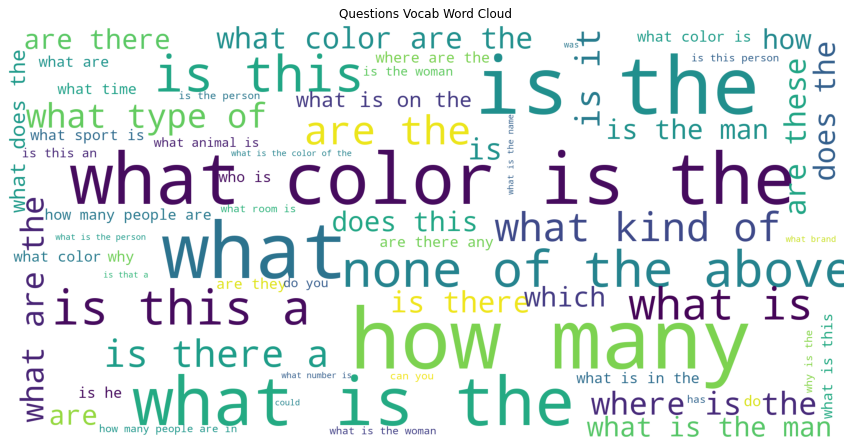

In [34]:
word_cloud = WordCloud(background_color='white',max_font_size=40,scale=5,random_state=1).generate_from_frequencies(ques_type_word_freq)
fig = plt.figure(1,figsize=(15,12))
plt.axis("off")
plt.title("Questions Vocab Word Cloud")
fig.subplots_adjust(top=2.3)
plt.imshow(word_cloud)
plt.show()

In [35]:
word_cloud.words_

{'how many': 1.0,
 'is the': 0.9138318934485241,
 'what': 0.8646508279337654,
 'what color is the': 0.7124280057595392,
 'what is the': 0.6101061915046796,
 'none of the above': 0.43844492440604754,
 'is this': 0.4244960403167747,
 'is this a': 0.4036627069834413,
 'what is': 0.33472822174226063,
 'are the': 0.28005759539236863,
 'what kind of': 0.2777627789776818,
 'is there a': 0.2408207343412527,
 'what type of': 0.19753419726421886,
 'is it': 0.19330453563714903,
 'what are the': 0.17935565154787617,
 'where is the': 0.17782577393808496,
 'is there': 0.1611321094312455,
 'is': 0.15793736501079914,
 'does the': 0.15784737221022319,
 'what color are the': 0.1541126709863211,
 'are these': 0.15357271418286536,
 'are there': 0.14259359251259898,
 'which': 0.13561915046796255,
 'what is the man': 0.13174946004319654,
 'is the man': 0.12742980561555076,
 'are': 0.1252249820014399,
 'how': 0.117170626349892,
 'does this': 0.11060115190784738,
 'what is on the': 0.10484161267098632,
 'what

In [36]:
word_cloud.stopwords

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

In [37]:
total_words = sum(ques_type_word_freq.values())
word_coverage = {word: np.round((frequency / total_words) * 100,2) for word, frequency in ques_type_word_freq.items()}
table = PrettyTable(["Question_Type","Count","Coverage"])
sorted_ques_type_counts = sorted(ques_type_word_freq.items(),key=lambda x:x[1],reverse=True)
for word, count in sorted_ques_type_counts:
    coverage_percentage = word_coverage[word]
    table.add_row([word, count, coverage_percentage])
print(table)

+--------------------------+-------+----------+
|      Question_Type       | Count | Coverage |
+--------------------------+-------+----------+
|         how many         | 22224 |   8.95   |
|          is the          | 20309 |   8.18   |
|           what           | 19216 |   7.74   |
|    what color is the     | 15833 |   6.38   |
|       what is the        | 13559 |   5.46   |
|    none of the above     |  9744 |   3.92   |
|         is this          |  9434 |   3.8    |
|        is this a         |  8971 |   3.61   |
|         what is          |  7439 |   3.0    |
|         are the          |  6224 |   2.51   |
|       what kind of       |  6173 |   2.49   |
|        is there a        |  5352 |   2.16   |
|       what type of       |  4390 |   1.77   |
|          is it           |  4296 |   1.73   |
|       what are the       |  3986 |   1.6    |
|       where is the       |  3952 |   1.59   |
|         is there         |  3581 |   1.44   |
|            is            |  3510 |   1

In [38]:
answer_type_counts = merge_df['multiple_choice_answer'].value_counts().reset_index()

In [39]:
answer_frequncy = list(zip(answer_type_counts['index'],answer_type_counts['multiple_choice_answer']))

In [40]:
answer_frequncy

[('yes', 58729),
 ('no', 36920),
 ('2', 8106),
 ('1', 4714),
 ('white', 4460),
 ('3', 4377),
 ('red', 3618),
 ('blue', 3267),
 ('4', 2577),
 ('green', 2395),
 ('black', 2269),
 ('yellow', 1863),
 ('brown', 1662),
 ('5', 1481),
 ('tennis', 1102),
 ('baseball', 1061),
 ('right', 1018),
 ('orange', 953),
 ('bathroom', 922),
 ('left', 921),
 ('6', 896),
 ('wood', 888),
 ('frisbee', 848),
 ('0', 845),
 ('pink', 820),
 ('pizza', 733),
 ('gray', 732),
 ('kitchen', 612),
 ('skateboarding', 594),
 ('cat', 571),
 ('7', 562),
 ('black and white', 561),
 ('skiing', 555),
 ('8', 539),
 ('dog', 527),
 ('surfing', 507),
 ('water', 503),
 ('snow', 503),
 ('skateboard', 488),
 ('10', 452),
 ('wii', 447),
 ('surfboard', 434),
 ('man', 430),
 ('kite', 429),
 ('grass', 422),
 ('purple', 409),
 ('giraffe', 405),
 ('eating', 394),
 ('broccoli', 383),
 ('stop', 372),
 ('elephant', 372),
 ('phone', 366),
 ('apple', 363),
 ('train', 358),
 ('winter', 355),
 ('umbrella', 331),
 ('sheep', 329),
 ('silver', 326),

In [41]:
question_type_frequncy = list(zip(ques_type_value_counts['question_type'],ques_type_value_counts['frequency']))

In [42]:
question_type_frequncy

[('how many', 22224),
 ('is the', 20309),
 ('what', 19216),
 ('what color is the', 15833),
 ('what is the', 13559),
 ('none of the above', 9744),
 ('is this', 9434),
 ('is this a', 8971),
 ('what is', 7439),
 ('are the', 6224),
 ('what kind of', 6173),
 ('is there a', 5352),
 ('what type of', 4390),
 ('is it', 4296),
 ('what are the', 3986),
 ('where is the', 3952),
 ('is there', 3581),
 ('is', 3510),
 ('does the', 3508),
 ('what color are the', 3425),
 ('are these', 3413),
 ('are there', 3169),
 ('which', 3014),
 ('what is the man', 2928),
 ('is the man', 2832),
 ('are', 2783),
 ('how', 2604),
 ('does this', 2458),
 ('what is on the', 2330),
 ('what does the', 2276),
 ('how many people are', 2234),
 ('what is in the', 2211),
 ('what is this', 2158),
 ('why', 2025),
 ('do', 1781),
 ('what are', 1768),
 ('are they', 1724),
 ('what time', 1671),
 ('what color', 1639),
 ('what sport is', 1543),
 ('are there any', 1499),
 ('is he', 1417),
 ('what color is', 1396),
 ('where are the', 1261),

In [43]:
top_question = [x[0] for x in question_type_frequncy[:50]]
top_answers = [x[0] for x in answer_frequncy[:50]]
aggregations = {'question': 'count'}
question_count = pd.DataFrame(merge_df.groupby(['question_type','multiple_choice_answer'],as_index=False).agg(aggregations))
filtered_question_count = question_count[question_count['question']>=10]
pivot_df = filtered_question_count.pivot(index='question_type', columns='multiple_choice_answer', values='question')

In [44]:
top_question

['how many',
 'is the',
 'what',
 'what color is the',
 'what is the',
 'none of the above',
 'is this',
 'is this a',
 'what is',
 'are the',
 'what kind of',
 'is there a',
 'what type of',
 'is it',
 'what are the',
 'where is the',
 'is there',
 'is',
 'does the',
 'what color are the',
 'are these',
 'are there',
 'which',
 'what is the man',
 'is the man',
 'are',
 'how',
 'does this',
 'what is on the',
 'what does the',
 'how many people are',
 'what is in the',
 'what is this',
 'why',
 'do',
 'what are',
 'are they',
 'what time',
 'what color',
 'what sport is',
 'are there any',
 'is he',
 'what color is',
 'where are the',
 'who is',
 'what animal is',
 'is the woman',
 'is this an',
 'do you',
 'how many people are in']

In [45]:
top_answers

['yes',
 'no',
 '2',
 '1',
 'white',
 '3',
 'red',
 'blue',
 '4',
 'green',
 'black',
 'yellow',
 'brown',
 '5',
 'tennis',
 'baseball',
 'right',
 'orange',
 'bathroom',
 'left',
 '6',
 'wood',
 'frisbee',
 '0',
 'pink',
 'pizza',
 'gray',
 'kitchen',
 'skateboarding',
 'cat',
 '7',
 'black and white',
 'skiing',
 '8',
 'dog',
 'surfing',
 'water',
 'snow',
 'skateboard',
 '10',
 'wii',
 'surfboard',
 'man',
 'kite',
 'grass',
 'purple',
 'giraffe',
 'eating',
 'broccoli',
 'stop']

In [46]:
filtered_question_count

,question_type,multiple_choice_answer,question
43,are,no,1418
72,are,yes,1282
119,are the,closed,14
141,are the,down,14
205,are the,no,2521
...,...,...,...
34181,why is the,rain,13
34182,why is the,raining,12
34188,why is the,resting,20
34197,why is the,safety,23


In [47]:
pivot_df

multiple_choice_answer,0,1,10,10 feet,100,10:10,11,12,12:00,12:30,...,x,yamaha,yellow,yellow and blue,yellow and red,yes,young,zebra,zebras,zoo
question_type,,,,,,,,,,,,,,,,,,,,,
are,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1282.0,NaN,NaN,NaN,NaN
are the,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,3266.0,NaN,NaN,NaN,NaN
are there,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2396.0,NaN,NaN,NaN,NaN
are there any,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,887.0,NaN,NaN,NaN,NaN
are these,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1727.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
where is the,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,NaN,35.0
which,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
who is,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
fig = px.bar(pivot_df.loc[:,top_answers], barmode='stack')

# Customize the layout
fig.update_layout(
    title="Question Types Vs Multiple-Choice Answers",
    title_x=0.5,
    xaxis_title="Question Type",
    yaxis_title="Count",
    legend_title="Multiple-Choice Answer"
)

# Show the plot
fig.show()

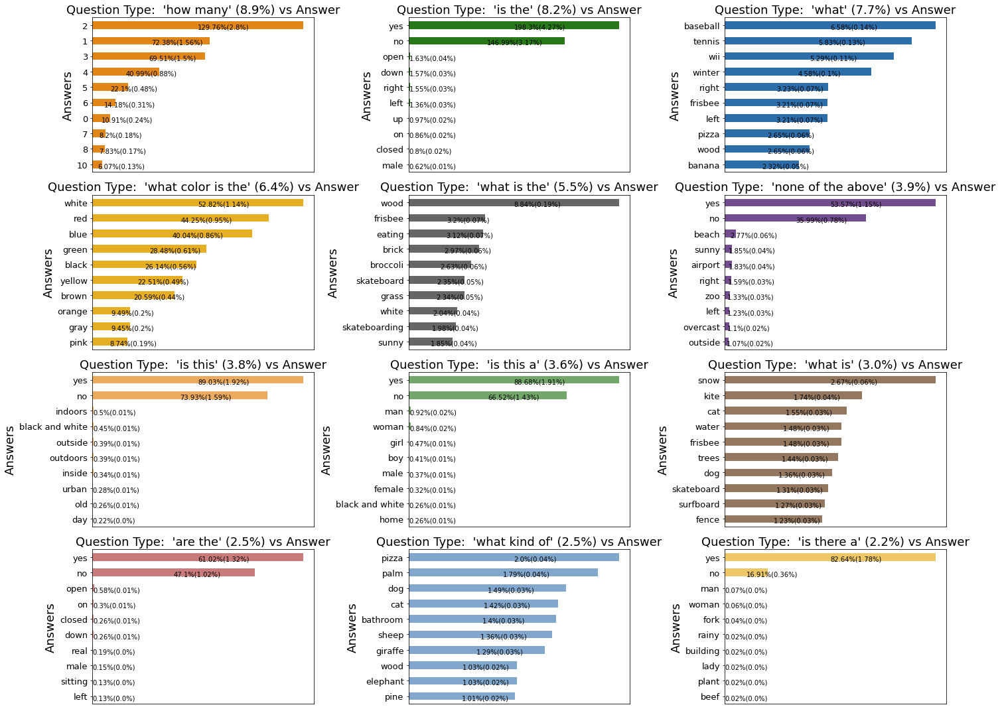

In [50]:
fig = plt.figure(figsize=(80,30))
fig.tight_layout() 
count = 1
colorCodes = [ "#E18719", "#287819", "#2D6EAA", "#E6AF23", "#666666","#724D8D", "#EAAB5E", "#73A769","#93785F",
              "#C97B7B", "#81A8CC", "#EDC765", "#858585","#957AA9", "#F3CFA3","#B4D0AF", "#BEADA0", "#E4BDBD", 
              "#ABC5DD", "#F4DB9C", "#A3A3A3"]

for _type,_ in list(ques_type_word_freq.items())[:12]:
    
    percentage = str(round((len(merge_df[merge_df['question_type']==_type])/len(merge_df))*100,1))+'%'

    plt.subplot(4, 3, count)
    question_type = merge_df[merge_df['question_type']==_type]
    ax = question_type['multiple_choice_answer'].value_counts()[:10][::-1].plot(kind='barh', figsize=(20,15),color=colorCodes[count-1], fontsize=13)
    ax.set_alpha(0.8)   
    ax.set_title("Question Type:  '" + _type + "' (" + percentage + ") vs Answer" , fontsize=18)
    ax.set_ylabel("Answers", fontsize=18)
    ax.get_xaxis().set_visible(False)


    for i in ax.patches:
        ax.text(i.get_width()/2, i.get_y(), str(round((i.get_width()/len(temp))*100, 2))+'%' + "(" +
                str(round((i.get_width()/len(merge_df))*100, 2))+'%' +")", fontsize=10,color='black')
        
    count += 1

fig.tight_layout()
plt.show()

In [53]:
merge_df['multiple_choice_answer'].value_counts()

yes            58729
no             36920
2               8106
1               4714
white           4460
               ...  
45 mph             1
2004               1
9/20/09            1
fish sticks        1
segments           1
Name: multiple_choice_answer, Length: 17140, dtype: int64

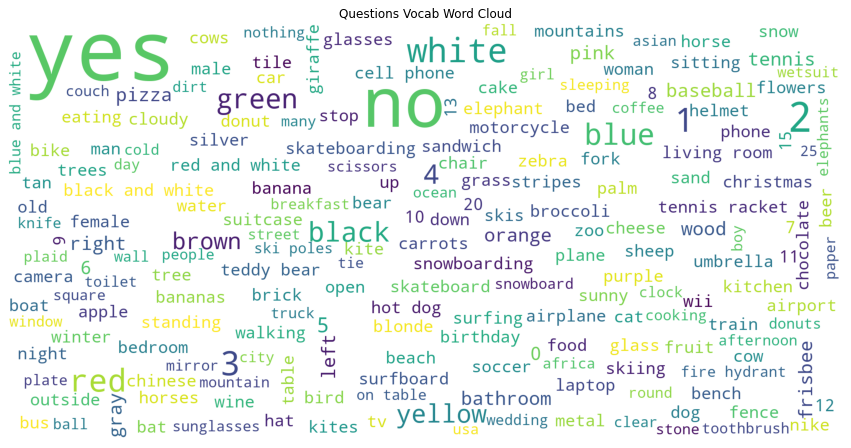

In [55]:
wordcloud = WordCloud(background_color='white',max_font_size=40,scale=5,random_state=42).generate_from_frequencies(merge_df['multiple_choice_answer'].value_counts())
fig = plt.figure(1,figsize=(15,12))
plt.axis("off")
plt.title("Questions Vocab Word Cloud")
fig.subplots_adjust(top=2.3)
plt.imshow(wordcloud)
plt.show()

In [59]:
wordcloud.words_

{'yes': 1.0,
 'no': 0.628650240937186,
 '2': 0.13802380425343527,
 '1': 0.08026698905140561,
 'white': 0.07594203885644231,
 '3': 0.0745287677297417,
 'red': 0.061604999233768665,
 'blue': 0.0556283948304926,
 '4': 0.04387951437960803,
 'green': 0.04078053431865007,
 'black': 0.038635086584140714,
 'yellow': 0.03172197721738834,
 'brown': 0.02829947725995675,
 '5': 0.025217524561971086,
 'tennis': 0.018764153995470722,
 'baseball': 0.018066032113606564,
 'right': 0.017333855505797816,
 'orange': 0.016227076912598545,
 'bathroom': 0.015699228660457355,
 'left': 0.015682201297485057,
 '6': 0.015256517223177647,
 'wood': 0.015120298319399275,
 'frisbee': 0.014439203800507415,
 '0': 0.014388121711590526,
 'pink': 0.013962437637283115,
 'pizza': 0.01248105705869332,
 'gray': 0.012464029695721024,
 'kitchen': 0.010420746139045447,
 'skateboarding': 0.01011425360554411,
 'cat': 0.009722624257181291,
 '7': 0.009569377990430622,
 'black and white': 0.009552350627458326,
 'skiing': 0.00945018644

In [68]:
ans_word_freq = dict(answer_frequncy)
sum_freq = sum(ans_word_freq.values())
ans_coverage = {ans:np.round((freq/sum_freq)*100,2) for ans,freq in ans_word_freq.items()}
table = PrettyTable(["Multiple Choice Answer","Count","Coverage(%)"])
sorted_answer_counts = sorted(ans_word_freq.items(),key=lambda x:x[1],reverse=True)
for word,count in sorted_answer_counts:
    coverage_percentage = ans_coverage[word]
    table.add_row([word,count,coverage_percentage])
print(table)

+----------------------------------------------------------------------+-------+-------------+
|                        Multiple Choice Answer                        | Count | Coverage(%) |
+----------------------------------------------------------------------+-------+-------------+
|                                 yes                                  | 58729 |    23.65    |
|                                  no                                  | 36920 |    14.87    |
|                                  2                                   |  8106 |     3.26    |
|                                  1                                   |  4714 |     1.9     |
|                                white                                 |  4460 |     1.8     |
|                                  3                                   |  4377 |     1.76    |
|                                 red                                  |  3618 |     1.46    |
|                                 blue            

In [70]:
merge_df.to_csv('merge.csv',index=False)